### About

4/8/2021

Program convert final_general.col and final_general.dat into columns then preprocess to graph a correlation heat map

@credit:
Qasim Wani in parse-checkpoint.ipynb

Other Techniques:

1/ https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec

2/ https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e

In [1]:
# !pip install mpld3 # make sure to pip install this in your local machine terminal

In [2]:
#parse data files into pandas csv
%matplotlib inline
import numpy as np
import pandas as pd
import mpld3
mpld3.enable_notebook()

### Preprocess data
File final_general.col contains all the columns headers

File final_general.dat has each lines representing the rows of the table

In [3]:
!ls

Correlation Analysis for UCI - Internet Usage (1999).ipynb
Correlation Analysis fro UCI - Internet Usage 1999.png
final_general.col
final_general.dat


In [4]:
# Number of characters in a row
len(np.array(pd.read_fwf("final_general.dat"))[0][0].split(' '))

72

In [5]:
def parse_data(str, num_col=69):
    """ Convert .txt file of feature space into a pandas csv file """
    data = np.array(pd.read_fwf(str))
    observations = [[]]*len(data)
    for i, x in enumerate(data):
        x = x[0].split(' ')
        features = [None]*num_col
        for j, val in enumerate(x):
            if val and val.isdigit() and j < num_col:
                features[j] = int(val)
        observations[i] = features
    return np.array(observations)

In [6]:
x = "final_general.dat"
data = parse_data(x)
data = [[item for item in row] for row in data]

In [7]:
column_names = np.array(pd.read_fwf("final_general.col")).T[0]  #T = Transpose dimension (this case dimension 1)

In [8]:
df = pd.DataFrame(data, columns = column_names)

In [9]:
df = df.dropna() # Function remove the missing data

In [20]:
df.head() # print out the first 5

,Age,Community Building,Community Membership_Family,Community Membership_Hobbies,Community Membership_None,Community Membership_Other,Community Membership_Political,Community Membership_Professional,Community Membership_Religious,Community Membership_Support,...,Web Ordering,Web Page Creation,Who Pays for Access_Don't Know,Who Pays for Access_Other,Who Pays for Access_Parents,Who Pays for Access_School,Who Pays for Access_Self,Who Pays for Access_Work,Willingness to Pay Fees,Years on Internet
0,2,28,2,0,0,0,0,0,0,0,...,1,1,1,2,0,0,0,0.0,1.0,0.0
1,99,25,0,1,1,0,0,0,1,0,...,2,1,1,1,0,0,0,0.0,1.0,1.0
2,29,28,0,0,0,0,1,0,0,0,...,1,1,1,1,0,0,0,0.0,1.0,0.0
3,15,17,0,0,0,0,0,1,1,0,...,2,1,1,1,0,0,0,0.0,1.0,0.0
4,99,55,2,1,0,0,0,0,1,1,...,1,1,1,1,0,0,0,0.0,1.0,1.0


In [11]:
df # print out everything

,Age,Community Building,Community Membership_Family,Community Membership_Hobbies,Community Membership_None,Community Membership_Other,Community Membership_Political,Community Membership_Professional,Community Membership_Religious,Community Membership_Support,...,Web Ordering,Web Page Creation,Who Pays for Access_Don't Know,Who Pays for Access_Other,Who Pays for Access_Parents,Who Pays for Access_School,Who Pays for Access_Self,Who Pays for Access_Work,Willingness to Pay Fees,Years on Internet
0,2,28,2,0,0,0,0,0,0,0,...,1,1,1,2,0,0,0,0.0,1.0,0.0
1,99,25,0,1,1,0,0,0,1,0,...,2,1,1,1,0,0,0,0.0,1.0,1.0
2,29,28,0,0,0,0,1,0,0,0,...,1,1,1,1,0,0,0,0.0,1.0,0.0
3,15,17,0,0,0,0,0,1,1,0,...,2,1,1,1,0,0,0,0.0,1.0,0.0
4,99,55,2,1,0,0,0,0,1,1,...,1,1,1,1,0,0,0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10096,99,25,2,0,0,0,0,1,1,0,...,1,1,1,1,0,0,0,1.0,0.0,1.0
10098,2,19,98,0,0,1,0,0,0,0,...,2,1,2,2,0,0,0,1.0,0.0,0.0
10099,99,39,2,0,0,1,0,0,0,0,...,3,1,2,1,0,0,0,0.0,1.0,1.0
10101,27,34,98,0,0,1,0,0,0,0,...,1,1,1,1,0,0,0,0.0,1.0,1.0


### Correlation Matrix

In [12]:
corrMatrix = df.corr() # using the correlation matrix
corrMatrix

,Age,Community Building,Community Membership_Family,Community Membership_Hobbies,Community Membership_None,Community Membership_Other,Community Membership_Political,Community Membership_Professional,Community Membership_Religious,Community Membership_Support,...,Web Ordering,Web Page Creation,Who Pays for Access_Don't Know,Who Pays for Access_Other,Who Pays for Access_Parents,Who Pays for Access_School,Who Pays for Access_Self,Who Pays for Access_Work,Willingness to Pay Fees,Years on Internet
Age,1.000000,0.161601,-0.002747,0.005234,-0.008904,-0.018401,0.018079,0.007889,0.069919,0.000183,...,-0.061943,0.004370,-0.019295,0.004505,-0.015669,-0.004807,-0.156867,-0.304268,0.141952,0.171069
Community Building,0.161601,1.000000,0.009383,-0.028374,-0.092004,0.026715,-0.057956,-0.024458,0.064568,-0.050606,...,-0.154385,-0.002050,-0.050347,-0.015430,-0.135059,-0.054413,-0.289699,-0.339163,0.311622,0.017783
Community Membership_Family,-0.002747,0.009383,1.000000,-0.039831,-0.315963,0.438004,-0.111919,-0.134083,-0.291106,-0.086391,...,-0.014337,-0.058793,0.018847,0.015063,0.033514,0.008837,0.008401,0.046315,-0.049560,-0.066233
Community Membership_Hobbies,0.005234,-0.028374,-0.039831,1.000000,0.032776,-0.097624,0.054072,0.024541,0.039818,0.032328,...,-0.040835,0.002556,-0.006880,-0.006438,0.190391,-0.001941,-0.000136,-0.011295,-0.004185,0.004644
Community Membership_None,-0.008904,-0.092004,-0.315963,0.032776,1.000000,-0.505546,0.113105,0.192451,0.165289,0.131993,...,0.025653,0.056600,-0.013813,-0.003594,-0.024550,0.005513,0.065434,0.031353,0.072081,-0.034529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Who Pays for Access_School,-0.004807,-0.054413,0.008837,-0.001941,0.005513,-0.015076,0.029868,0.006678,-0.030629,0.013490,...,-0.015195,-0.013807,0.025831,0.012734,0.015259,1.000000,-0.031664,-0.036708,-0.162868,-0.084294
Who Pays for Access_Self,-0.156867,-0.289699,0.008401,-0.000136,0.065434,-0.020921,0.051284,0.016926,-0.131494,0.022238,...,0.280515,-0.014975,0.050621,0.016887,-0.005476,-0.031664,1.000000,0.122876,-0.246537,-0.152374
Who Pays for Access_Work,-0.304268,-0.339163,0.046315,-0.011295,0.031353,0.023913,0.029900,0.017716,-0.077808,0.013960,...,0.061492,0.005155,0.037390,0.023947,-0.029419,-0.036708,0.122876,1.000000,-0.351567,-0.198508
Willingness to Pay Fees,0.141952,0.311622,-0.049560,-0.004185,0.072081,-0.050261,0.048904,0.052405,0.045276,0.009299,...,-0.109582,0.010353,-0.052641,-0.011234,-0.105979,-0.162868,-0.246537,-0.351567,1.000000,-0.258322


### Get Visual Representation of Correlation Matrix using Seaborn and Matplotlib

@credit: https://datatofish.com/correlation-matrix-pandas/

In [13]:
import seaborn as sn
import matplotlib.pyplot as plt

In [14]:
# add a heat map for correlation matrix
# Way 1: Gradient numbers - Diverging Color Pallette
corrMatrix.style.background_gradient(cmap="gray")


In [15]:
#Way 2: Gradient no number - Diverging color palette
corrMatrix.style.background_gradient(cmap="gray").set_properties(**{"font-size": "0pt"})

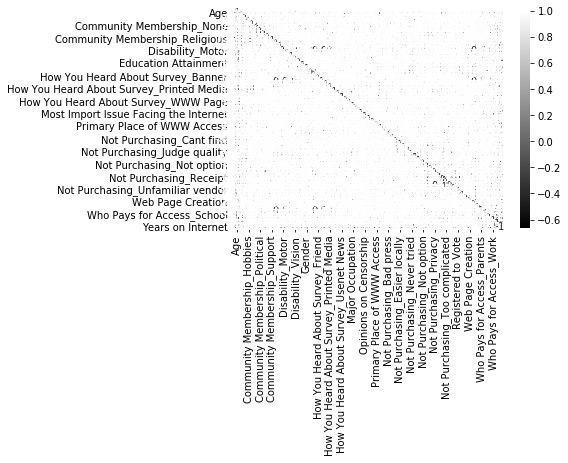

In [16]:
#Way 3: Seaborn gray scale
sn.heatmap(corrMatrix, cmap = "gray", annot=True)
plt.show()

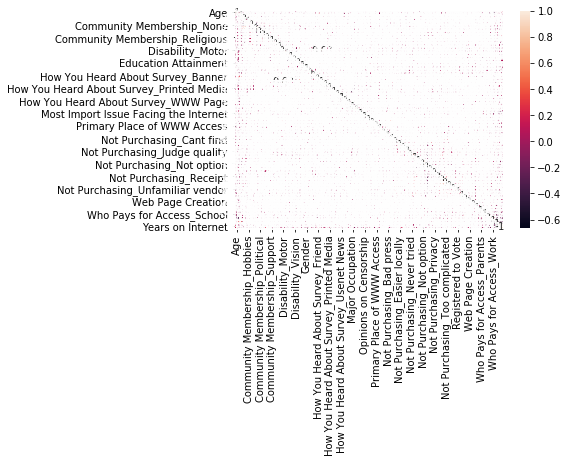

In [17]:
# Way 4: Seaborn Color
sn.heatmap(corrMatrix, annot=True)
plt.show()

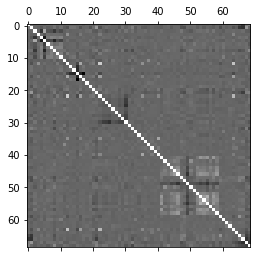

In [18]:
plt.matshow(corrMatrix, cmap = "gray")
plt.show()


In [19]:
plt.savefig("Correlation Analysis fro UCI - Internet Usage 1999")

<Figure size 432x288 with 0 Axes>